by Wedad\
This file is intended to visualise and determine the importance of each feature when it comes to prediction tasks
To determine the importance of each feature in relation to dod, the data was balanced to keep it 1:1

In [78]:
import seaborn as sns
import pandas as pd

Create a dataset of 50:50 given dod split

In [79]:
aki_df = pd.read_csv('../data/df_final_AKI.csv')
aki_df


dod_df = aki_df[aki_df['dod']==1]
alive_df = aki_df[aki_df['dod']==0]

final_dod = dod_df.head(1659).append(alive_df.head(1659), ignore_index=True)
final_dod = final_dod.drop(columns=['Unnamed: 0', 'subject_id'])
final_dod

C:\Users\skyfi\AppData\Local\Temp\ipykernel_21816\2215573738.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_dod = dod_df.head(1659).append(alive_df.head(1659), ignore_index=True)


,dod,gender,age,Albumin,Creatinine,Hemoglobin,INR(PT),PT,Sodium,Urea Nitrogen,Arterial Blood Pressure diastolic,Arterial Blood Pressure systolic,Heart Rate,Respiratory Rate,hypertension,chronic_kidney_disease,sepsis,Intercept
0,1,1,71,3.9,1.2,10.2,1.3,15.2,136.0,53.0,56.0,114.0,128.0,26.0,1,0,0,1
1,1,0,62,4.0,1.4,12.3,1.2,13.1,134.0,45.0,56.0,114.0,94.0,12.0,0,0,0,1
2,1,0,73,2.1,0.4,10.2,1.1,12.4,134.0,11.0,56.0,114.0,103.0,26.0,0,0,0,1
3,1,0,79,2.1,0.2,10.2,1.3,11.4,134.0,16.0,56.0,114.0,91.0,18.0,0,0,0,1
4,1,0,66,2.7,0.7,10.2,2.1,38.4,143.0,19.0,54.0,117.0,90.0,24.0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3313,0,1,69,3.5,1.0,11.7,1.1,11.4,136.0,10.0,52.0,134.0,76.0,16.0,0,0,0,1
3314,0,0,56,2.4,0.7,10.2,1.0,11.4,140.0,6.0,56.0,114.0,92.0,19.0,1,0,1,1
3315,0,0,35,3.5,0.6,11.5,1.3,16.5,138.0,5.0,66.0,106.0,95.0,14.0,0,0,0,1
3316,0,1,35,2.4,3.6,10.2,1.1,16.7,135.0,4.0,57.0,92.0,101.0,26.0,0,0,0,1


Visualise the clusters for how the features are distributed, given dod

In [80]:
def visualiser(df, focus_column, plot_title):
    cohort_grid = sns.PairGrid(df, hue=focus_column, palette="colorblind")
    cohort_grid.map_offdiag(sns.scatterplot)
    cohort_grid.map_diag(sns.ecdfplot, stat="count")
    cohort_grid.add_legend(title=plot_title)

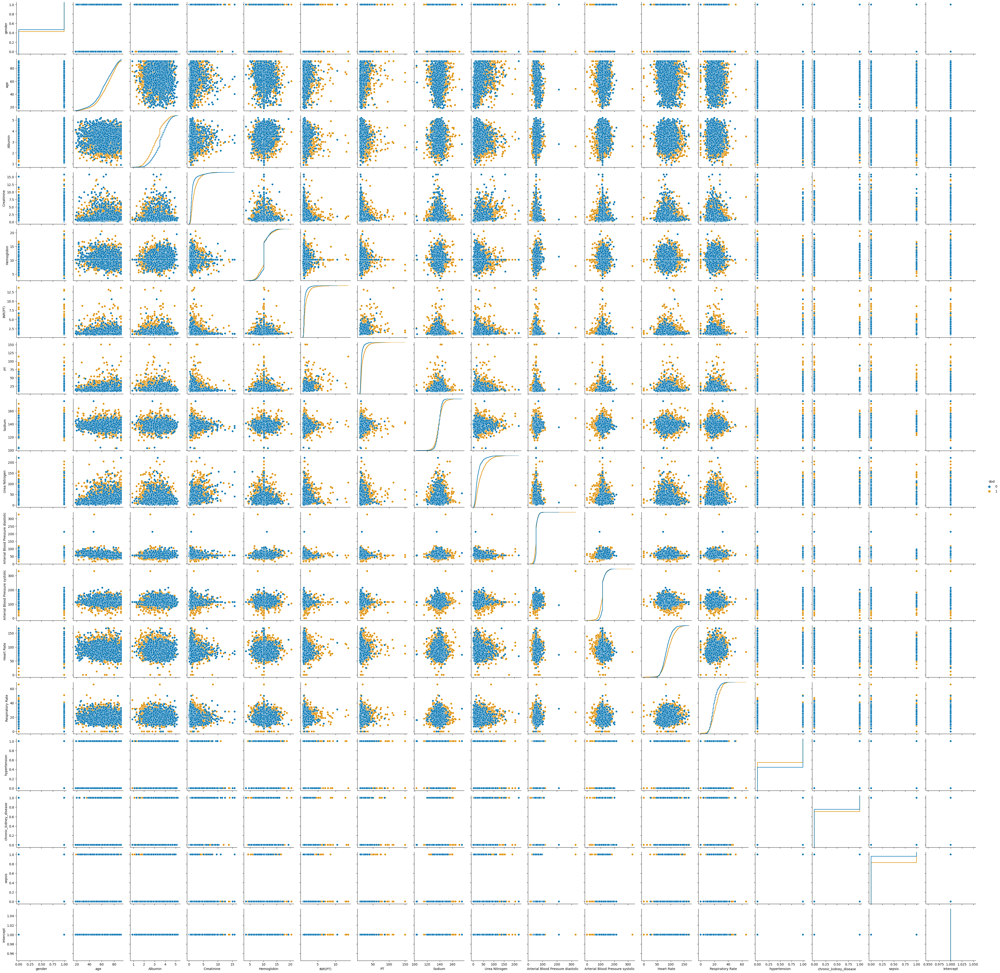

In [43]:
visualiser(final_dod, 'dod', 'dod')

Remove columns to check its affect on the prediction task

In [104]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score,  f1_score

undersample the data to make it 30:70 split\
From baseline models, we see that RandomOverSampler, SMOTE and ADASYN do not perform too well\
therefore, we will attempt to use undersampling techniques

In [105]:
final_dod = dod_df.head(1659).append(alive_df.head(3871), ignore_index=True)
final_dod = final_dod.drop(columns=['Unnamed: 0', 'subject_id'])
final_dod

C:\Users\skyfi\AppData\Local\Temp\ipykernel_21816\3201351788.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_dod = dod_df.head(1659).append(alive_df.head(3871), ignore_index=True)


,dod,gender,age,Albumin,Creatinine,Hemoglobin,INR(PT),PT,Sodium,Urea Nitrogen,Arterial Blood Pressure diastolic,Arterial Blood Pressure systolic,Heart Rate,Respiratory Rate,hypertension,chronic_kidney_disease,sepsis,Intercept
0,1,1,71,3.9,1.2,10.2,1.3,15.2,136.0,53.0,56.0,114.0,128.0,26.0,1,0,0,1
1,1,0,62,4.0,1.4,12.3,1.2,13.1,134.0,45.0,56.0,114.0,94.0,12.0,0,0,0,1
2,1,0,73,2.1,0.4,10.2,1.1,12.4,134.0,11.0,56.0,114.0,103.0,26.0,0,0,0,1
3,1,0,79,2.1,0.2,10.2,1.3,11.4,134.0,16.0,56.0,114.0,91.0,18.0,0,0,0,1
4,1,0,66,2.7,0.7,10.2,2.1,38.4,143.0,19.0,54.0,117.0,90.0,24.0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5525,0,0,64,3.6,1.1,9.9,2.5,13.9,141.0,18.0,61.0,123.0,78.0,14.0,1,1,0,1
5526,0,1,77,4.2,1.9,10.4,1.1,13.1,143.0,25.0,61.0,146.0,70.0,24.0,1,1,0,1
5527,0,1,71,4.7,1.0,8.5,1.1,11.9,139.0,15.0,53.0,120.0,67.0,18.0,1,1,0,1
5528,0,1,55,4.2,1.2,8.8,1.2,14.0,141.0,29.0,66.0,67.0,82.0,27.0,1,1,0,1


Try removing one feature and running the algorithmn to check if the performance improves

In [106]:
def featureRemover(df, relevant_columns, random_states, removal_pairs, model):

    for i, col in enumerate(relevant_columns):   
        # Get the baseline
        if i == 0:
            X = df.drop(columns=['dod'])
            col = 'baseline'
        else:
            X = df.drop(columns=['dod', col]) 
        y = df['dod']
        total_accuracy = 0
        total_precision = 0
        total_recall = 0
        total_f1 = 0
        rand_length = len(random_states)
        for j in random_states:
            X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=j)
            # Train the model
            model.fit(X_train, y_train)
            # Predict
            y_pred_lin = model.predict(X_test)
            # Convert predictions to binary using 0.5 as threshold
            y_pred_bin = [1 if y > 0.5 else 0 for y in y_pred_lin]
            total_accuracy += accuracy_score(y_test, y_pred_bin)
            total_precision += precision_score(y_test, y_pred_bin)
            total_recall += recall_score(y_test, y_pred_bin)
            total_f1 += f1_score(y_test, y_pred_bin)

        removal_pairs.append([col, total_accuracy/rand_length, total_precision/rand_length ,total_recall/rand_length ,total_f1/rand_length])
        # print("Accuracy of", col , total/len(random_states))
    return removal_pairs

In [107]:
# ALl column names
relevant_columns = ['dod','gender', 'age', 'Albumin',
       'Creatinine', 'Hemoglobin', 'INR(PT)', 'PT', 'Sodium', 'Urea Nitrogen',
       'Arterial Blood Pressure diastolic', 'Arterial Blood Pressure systolic',
       'Heart Rate', 'Respiratory Rate', 'hypertension',
       'chronic_kidney_disease', 'sepsis', 'Intercept']

#Average across multiple states to get an accurate measurement
random_states = [0,1,2,3,4,5,6,7,8,9,0,10,12,13,14,15,16,17,18,19,20]

# Removed Pair + Accuracy
removal_pairs = []

lin_reg = LinearRegression()
removal_pair = featureRemover(final_dod,relevant_columns, random_states, removal_pairs, lin_reg)

removal_lin_df = pd.DataFrame(removal_pairs, columns=['removed', 'accuracy', 'precision', 'recall', 'F1 Score'])
removal_lin_df = removal_lin_df.sort_values(by=['accuracy'])
removal_lin_df

,removed,accuracy,precision,recall,F1 Score
11,Arterial Blood Pressure systolic,0.748256,0.665412,0.325014,0.436228
13,Respiratory Rate,0.749376,0.669007,0.327022,0.438705
12,Heart Rate,0.751399,0.677489,0.329030,0.442306
2,age,0.751830,0.669058,0.343373,0.453252
15,chronic_kidney_disease,0.753078,0.672381,0.346672,0.456797
3,Albumin,0.753122,0.704690,0.306942,0.426994
4,Creatinine,0.754069,0.675587,0.347676,0.458630
7,PT,0.754112,0.676430,0.347676,0.458625
16,sepsis,0.754155,0.676702,0.347390,0.458460
14,hypertension,0.755188,0.677797,0.351836,0.462538


In [85]:
# # Check for Logistic Regression too to see if the values are similar
# # They are similar but not exact
# removal_pairs = []
# log_reg = LogisticRegression(solver='lbfgs', max_iter=10000)
# removal_pair = featureRemover(final_dod, relevant_columns, [1,2,3,4,5,6,7,8,9,10,42], removal_pairs, log_reg)

# removal_log_df = pd.DataFrame(removal_pairs, columns=['removed', 'accuracy', 'precision', 'recall', 'F1 Score'])
# removal_log_df = removal_log_df.sort_values(by=['accuracy'])
# removal_log_df

In [118]:
removed_cols = removal_lin_df['removed'].tail(4).values.tolist()
removed_cols.append('dod')
no_remove_cols = removal_lin_df['removed'].head(10).values.tolist()
no_remove_cols.append('dod')

In [119]:
def algTester(df, col_remove=['dod'],seed_list = [42], model = LinearRegression(), title='Original accuracy:'):
    X = df.drop(columns=col_remove) 
    y = df['dod']
    total_accuracy = 0
    total_precision = 0
    total_recall = 0
    total_f1 = 0
    for j in seed_list:
        X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,  test_size=0.2, random_state=j)
        model.fit(X_train, y_train)
        y_pred_lin = model.predict(X_test)
        y_pred_bin = [1 if y > 0.5 else 0 for y in y_pred_lin]
        total_accuracy += accuracy_score(y_test, y_pred_bin)
        total_precision += precision_score(y_test, y_pred_bin)
        total_recall += recall_score(y_test, y_pred_bin)
        total_f1 += f1_score(y_test, y_pred_bin)
    print(f'{title}: {total_accuracy/len(random_states)} precision: { total_precision/len(random_states)} recall: { total_recall/len(random_states)} f1: {total_f1/len(random_states)}')
    

In [120]:
lin_reg = LinearRegression()
algTester(final_dod, ['dod'], random_states, lin_reg, title='All Feature Undersampling Linear Regression Accuracy: ')
algTester(final_dod, removed_cols, random_states, lin_reg, title='Removed Bad Features Undersampling Linear Regression Accuracy: ')
algTester(final_dod, no_remove_cols, random_states, lin_reg, title='Removed Good Features Undersampling Linear Regression Accuracy: ')

All Feature Undersampling Linear Regression Accuracy: : 0.7556187031774735 precision: 0.6783132570420884 recall: 0.3538439472174412 f1: 0.46457299257794976
Removed Bad Features Undersampling Linear Regression Accuracy: : 0.756953414277103 precision: 0.6855380882167191 recall: 0.3518359150889271 f1: 0.4644762120056576
Removed Good Features Undersampling Linear Regression Accuracy: : 0.7121329544476017 precision: 0.5976326201422365 recall: 0.12593230063109584 f1: 0.207632939821707


Try this for the full dataset containing imbalance

In [122]:
full_df =  aki_df.drop(columns=['Unnamed: 0', 'subject_id']) 
# Removed Pair + Accuracy
removal_pairs = []

lin_reg = LinearRegression()
removal_pair = featureRemover(full_df,relevant_columns, random_states, removal_pairs, lin_reg)

removal_lin_df = pd.DataFrame(removal_pairs, columns=['removed', 'accuracy', 'precision', 'recall', 'F1 score'])
removal_lin_df = removal_lin_df.sort_values(by=['accuracy'])
removal_lin_df

,removed,accuracy,precision,recall,F1 score
11,Arterial Blood Pressure systolic,0.838187,0.685567,0.081899,0.146043
15,chronic_kidney_disease,0.838576,0.705861,0.079604,0.142828
7,PT,0.838673,0.706771,0.080321,0.143969
3,Albumin,0.838721,0.700691,0.082760,0.147805
6,INR(PT),0.838916,0.698563,0.085772,0.152497
13,Respiratory Rate,0.839717,0.707602,0.091079,0.160967
9,Urea Nitrogen,0.839717,0.739539,0.082473,0.148175
12,Heart Rate,0.840008,0.721932,0.089071,0.158058
16,sepsis,0.840153,0.734166,0.087780,0.156482
10,Arterial Blood Pressure diastolic,0.840493,0.722103,0.094664,0.167078


In [125]:
removed_cols = removal_df['removed'].tail(3).values.tolist()
removed_cols.append('dod')
no_remove_cols = removal_df['removed'].head(11).values.tolist()
no_remove_cols.append('dod')

In [126]:
lin_reg = LinearRegression()
algTester(full_df, ['dod'], random_states, lin_reg, title='All Feature Imbalance Linear Regression Accuracy: ')
algTester(full_df, removed_cols, random_states, lin_reg, title='Removed Bad Features Imbalance Linear Regression Accuracy: ')

All Feature Imbalance Linear Regression Accuracy: : 0.8408329692733364 precision: 0.7276828247367638 recall: 0.09609868043602983 f1: 0.1694816983308641
Removed Bad Features Imbalance Linear Regression Accuracy: : 0.8414154652686763 precision: 0.744108945060884 recall: 0.09652897303499712 f1: 0.17063640209361827


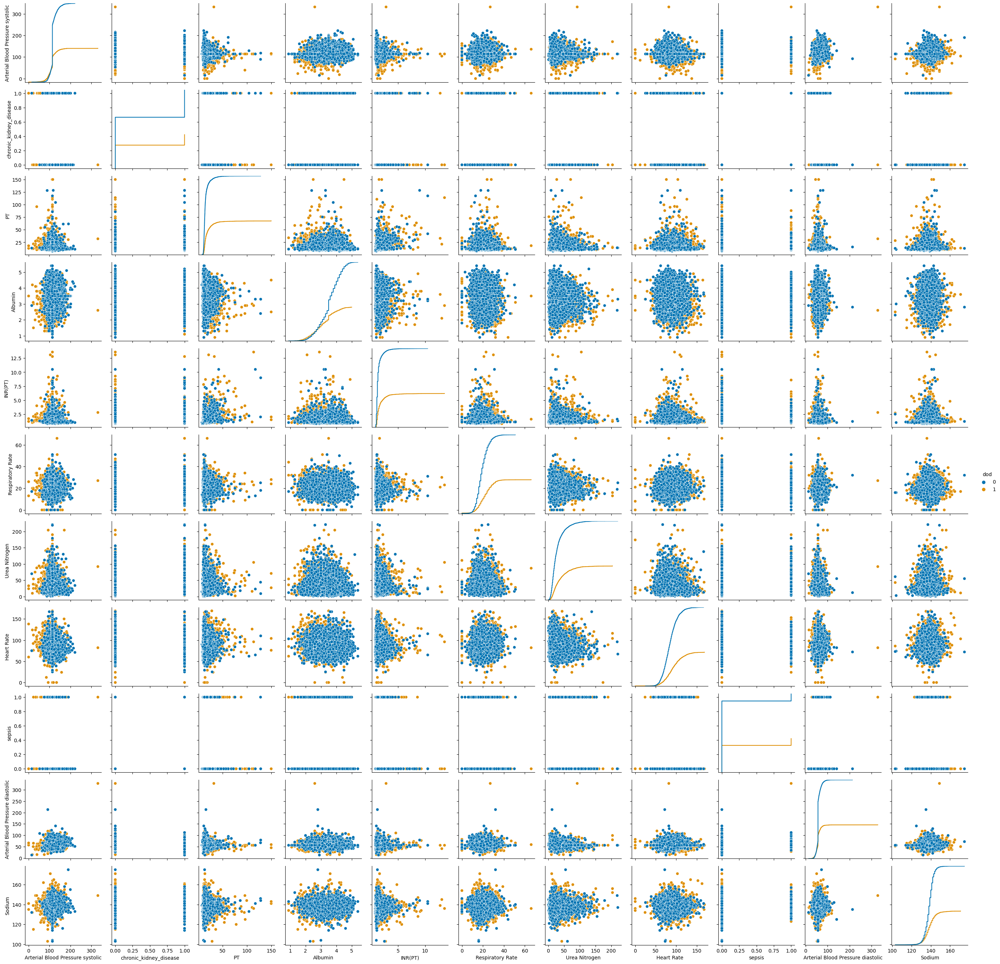

In [127]:
visualiser(final_dod[no_remove_cols], 'dod', 'dod')

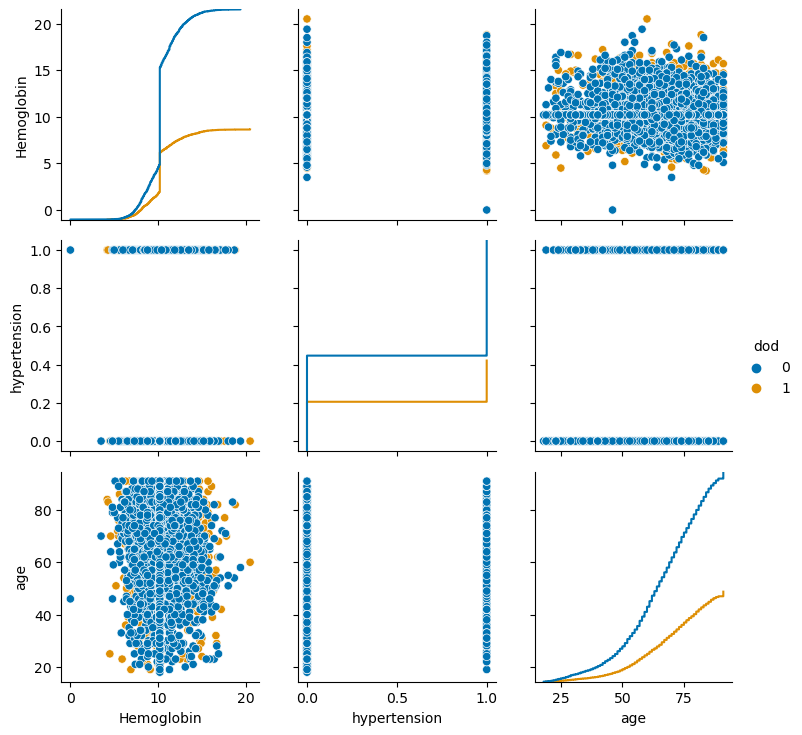

In [128]:
visualiser(final_dod[removed_cols], 'dod', 'dod')

Check Feature Importance using random forest classifier 

In [139]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import numpy as np

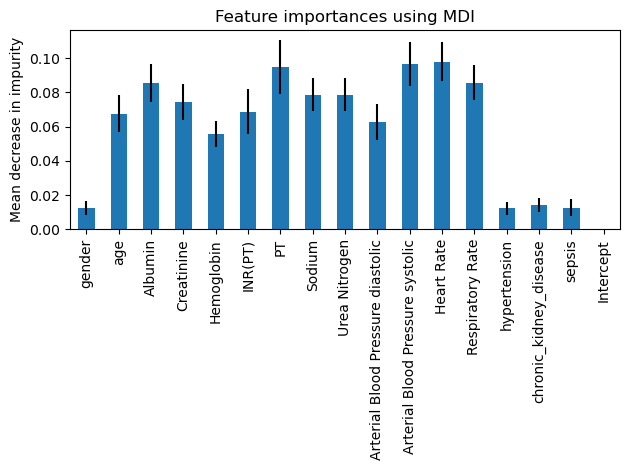

In [143]:
X = full_df.drop(columns=['dod'])
y = full_df['dod']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

feature_names = [f"{i}" for i in X]
forest = RandomForestClassifier(random_state=0)
forest.fit(X_train, y_train)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)

forest_importances = pd.Series(importances, index=feature_names)


fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

See if removing these improve performance

In [146]:
lin_reg = LinearRegression()
algTester(final_dod, ['dod'], random_states, lin_reg, title='All Feature undersample Linear Regression Accuracy: ')
algTester(final_dod, ['dod','gender','hypertension','sepsis','chronic_kidney_disease','sepsis','Intercept'], random_states, lin_reg, title='Removed Bad Feature undersample Linear Regression Accuracy:')
print('----------------------------------')
algTester(full_df, ['dod'], random_states, lin_reg, title='All Feature Imbalance Linear Regression Accuracy: ')
algTester(full_df, ['dod','gender','hypertension','sepsis','chronic_kidney_disease','sepsis','Intercept'], random_states, lin_reg, title='Removed Bad Features Imbalance Linear Regression Accuracy: ')

All Feature undersample Linear Regression Accuracy: : 0.7556187031774735 precision: 0.6783132570420884 recall: 0.3538439472174412 f1: 0.46457299257794976
Removed Bad Feature undersample Linear Regression Accuracy:: 0.7504090243692414 precision: 0.6690565653046884 recall: 0.3343373493975903 f1: 0.44512740228421616
----------------------------------
All Feature Imbalance Linear Regression Accuracy: : 0.8408329692733364 precision: 0.7276828247367638 recall: 0.09609868043602983 f1: 0.1694816983308641
Removed Bad Features Imbalance Linear Regression Accuracy: : 0.8392796466190963 precision: 0.7291983373827913 recall: 0.08075157773952954 f1: 0.14507332679403262


Removing all of these seems to be detrimental to the model performance, however\
gender hypotension Intercept seems to be the commonality between the two approach

In [151]:
algTester(final_dod, ['dod'], random_states, lin_reg, title='All Feature undersample Linear Regression Accuracy: ')
algTester(final_dod, ['dod','gender','hypertension','Intercept'], random_states, lin_reg, title='Removed Bad Feature undersample Linear Regression Accuracy:')
print('----------------------------------')
algTester(full_df, ['dod'], random_states, lin_reg, title='All Feature Imbalance Linear Regression Accuracy: ')
algTester(full_df, ['dod','gender','hypertension','Intercept'], random_states, lin_reg, title='Removed Bad Features Imbalance Linear Regression Accuracy: ')

All Feature undersample Linear Regression Accuracy: : 0.7556187031774735 precision: 0.6783132570420884 recall: 0.3538439472174412 f1: 0.46457299257794976
Removed Bad Feature undersample Linear Regression Accuracy:: 0.754843709635753 precision: 0.6774457915017011 recall: 0.35040160642570284 f1: 0.46127122898934864
----------------------------------
All Feature Imbalance Linear Regression Accuracy: : 0.8408329692733364 precision: 0.7276828247367638 recall: 0.09609868043602983 f1: 0.1694816983308641
Removed Bad Features Imbalance Linear Regression Accuracy: : 0.8415125479345663 precision: 0.7499797139518248 recall: 0.09566838783706254 f1: 0.16938996556685776


Very Minor improvement in accuracy and precision but detriment to recall